<a href="https://colab.research.google.com/github/thangcn1943/Yeast_cell_v2/blob/main/unet_keras.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
%cd "/content/drive/MyDrive/Yeast"

/content/drive/MyDrive/Yeast


In [ ]:
import numpy as np
from keras.models import load_model
import tensorflow as tf
from glob import glob
import cv2
from keras.layers import Conv2D, BatchNormalization, Activation, MaxPooling2D, Conv2DTranspose, Concatenate, Input
from keras.models import Model
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, CSVLogger
from google.colab.patches import cv2_imshow
import os

In [ ]:
os.environ['PYTHONHASHSEED'] = str(42)
np.random.seed(42)
tf.random.set_seed(42)

In [ ]:
lr = 1e-4
epochs = 100
height = 1280
width = 1280
batch_size = 100
tile_size = 128

In [ ]:
dataset_path = os.path.join("dataset","non-aug")
files_dir = os.path.join("files","non-aug")

model_file = os.path.join(files_dir,"128unet-non-aug.keras")
log_file = os.path.join(files_dir, "128log-non-aug.csv")

In [ ]:
def create_dir(path):
    if not os.path.exists(path):
        os.makedirs(path)

In [ ]:
create_dir(files_dir)

In [ ]:
def split_image(dem,image, tile_size, output_dir):
    # Chia ảnh thành các phần nhỏ
    for i in range(0, image.shape[0], tile_size):
        for j in range(0, image.shape[1], tile_size):
            tile = image[i:i + tile_size, j:j + tile_size]
            cv2.imwrite(os.path.join(output_dir,f"{dem}_{i}_{j}.png"), tile)

# **Split Train**

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
train_images = sorted(glob("dataset/non-aug/train/images/*"))
train_masks = sorted(glob("dataset/non-aug/train/mask/*"))

In [ ]:
len(train_masks)

35

In [ ]:
for i in range(len(train_images)):
    image = cv2.imread(train_images[i])
    mask = cv2.imread(train_masks[i])
    split_image(i,image, tile_size, "dataset/non-aug/train/128images")
    split_image(i,mask, tile_size, "dataset/non-aug/train/128masks")

In [ ]:
images = sorted(glob("dataset/non-aug/train/128images/*"))
masks = sorted(glob("dataset/non-aug/train/128masks/*"))
print(f"Train: {len(images)} -- {len(masks)}")

Train: 3500 -- 3500


# Build Unet

Conv_Block

In [ ]:
def conv_block(inputs, num_filters):
    # x = Conv2D(num_filters,3,padding="same")(inputs)
    # x = BatchNormalization()(x)
    # x = Activation("relu")(x)

    x = Conv2D(num_filters,3,padding="same")(inputs)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

Encoder

In [ ]:
def encoder_block(inputs, num_filters):
    x = conv_block(inputs, num_filters)
    p = MaxPooling2D(2, 2)(x)
    return x,p

Decoder

In [ ]:
def decoder_block(input_tensor, concat_tensor, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=(2, 2), padding="same")(input_tensor)
    # concat_tensor = tf.image.resize_with_crop_or_pad(concat_tensor, tf.shape(x)[1], tf.shape(x)[2])
    x = Concatenate()([x, concat_tensor])
    x = conv_block(x, num_filters)
    return x

Build ThinNet

In [ ]:
def build_unet(input_shape):
    inputs = Input(input_shape)

    """ Encoder """
    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2,256)
    s4, p4 = encoder_block(p3,512)
    """ Bridge """
    b1 = conv_block(p4,1024)

    """ Decoder """
    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)
    model = Model(inputs,outputs, name = "UNET")

    return model

Dataset Pipeline

In [ ]:
def load_data(path):
    train_x = sorted(glob(os.path.join(path, "train", "128images", "*")))
    train_y = sorted(glob(os.path.join(path, "train", "128masks", "*")))

    valid_x = sorted(glob(os.path.join(path, "valid", "128images", "*")))
    valid_y = sorted(glob(os.path.join(path, "valid", "128masks", "*")))

    return (train_x,train_y), (valid_x,valid_y)

# Read_image

In [ ]:
def read_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    #image = tf.image.resize_with_crop_or_pad(image, [new_height, new_width], method=tf.image.ResizeMethod.BICUBIC)
    image = tf.cast(image, tf.float32) / 255.0
    return image

In [ ]:
def read_mask(mask_path):
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    #mask = tf.image.resize_with_crop_or_pad(mask, [new_height, new_width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    mask = tf.cast(mask, tf.float32) / 255.0
    return mask

In [ ]:
def tf_parse(x, y):
    def _parse(x, y):
        x = read_image(x)
        y = read_mask(y)
        return x,y

    x,y = tf.numpy_function(_parse,[x,y], [tf.float32, tf.float32])
    x.set_shape([tile_size, tile_size, 3])
    y.set_shape([tile_size, tile_size, 1])
    # print(x.shape)
    # print(y.shape)
    return x, y

In [ ]:
def tf_dataset(x, y , batch = 5):
    dataset = tf.data.Dataset.from_tensor_slices((x,y))
    dataset = dataset.map(tf_parse, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(batch)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset

In [ ]:
(train_x, train_y),(valid_x, valid_y) = load_data(dataset_path)
print(f"Train: {len(train_x)} - {len(train_y)}")
print(f"Valid: {len(valid_x)} - {len(valid_y)}")

Train: 3500 - 3500
Valid: 500 - 500


In [ ]:
train_dataset = tf_dataset(train_x, train_y, batch=100)
valid_dataset = tf_dataset(valid_x, valid_y, batch=100)

In [ ]:
for x, y in valid_dataset:
    print(x.shape, y.shape)

(100, 128, 128, 3) (100, 128, 128, 1)
(100, 128, 128, 3) (100, 128, 128, 1)
(100, 128, 128, 3) (100, 128, 128, 1)
(100, 128, 128, 3) (100, 128, 128, 1)


In [ ]:
input_shape = (tile_size, tile_size, 3)
model = build_unet(input_shape)

In [ ]:
model.summary()

Model: "UNET"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 128, 128, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 128, 128, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 128, 128, 64)   │            256 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 128, 128, 64)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 64, 64, 64)     │              0 │ activation[0][0]       │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 64, 64, 128)    │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 64, 64, 128)    │            512 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 64, 64, 128)    │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 32, 32, 128)    │              0 │ activation_1[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 32, 32, 256)    │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 32, 32, 256)    │          1,024 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activation) │ (None, 32, 32, 256)    │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 16, 16, 256)    │              0 │ activation_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 16, 16, 512)    │      1,180,160 │ max_pooling2d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 16, 16, 512)    │          2,048 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 16, 16, 512)    │              0 │ batch_normalization_3… │
├──────────────────────

 Total params: 15,336,513 (58.50 MB)

 Trainable params: 15,330,625 (58.48 MB)

 Non-trainable params: 5,888 (23.00 KB)

In [ ]:
opt = tf.keras.optimizers.Adam(lr) # Use tf.keras.optimizers instead of tf.keras.optimizer
model.compile(loss = "binary_crossentropy", optimizer = opt, metrics=[tf.keras.metrics.MeanIoU(num_classes=2)])

In [ ]:
callbacks = [
    ModelCheckpoint(model_file, verbose=1, save_best_only=True),
    ReduceLROnPlateau(monitor="val_loss", factor=0.1, patience=4),
    CSVLogger(log_file),
    EarlyStopping(monitor="val_loss", patience=20, restore_best_weights=False)
]

In [ ]:
model.fit(
    train_dataset,
    validation_data = valid_dataset,
    epochs = epochs,
    callbacks = callbacks
)

Epoch 1/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 0.3256 - mean_io_u: 0.4743
Epoch 1: val_loss improved from inf to 0.56357, saving model to files/non-aug/128unet-non-aug.keras
35/35 ━━━━━━━━━━━━━━━━━━━━ 141s 2s/step - loss: 0.3239 - mean_io_u: 0.4738 - val_loss: 0.5636 - val_mean_io_u: 0.4852 - learning_rate: 1.0000e-04
Epoch 2/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 0.1745 - mean_io_u: 0.4743
Epoch 2: val_loss improved from 0.56357 to 0.47275, saving model to files/non-aug/128unet-non-aug.keras
35/35 ━━━━━━━━━━━━━━━━━━━━ 62s 2s/step - loss: 0.1742 - mean_io_u: 0.4738 - val_loss: 0.4727 - val_mean_io_u: 0.4852 - learning_rate: 1.0000e-04
Epoch 3/100
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - loss: 0.1279 - mean_io_u: 0.4743
Epoch 3: val_loss improved from 0.47275 to 0.42060, saving model to files/non-aug/128unet-non-aug.keras
35/35 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - loss: 0.1277 - mean_io_u: 0.4738 - val_loss: 0.4206 - val_mean_io_u: 0.4852 - learning_rate: 1.0000e-04
E

In [ ]:
anh_goc = cv2.imread("dataset/non-aug/train/images/10_.png")

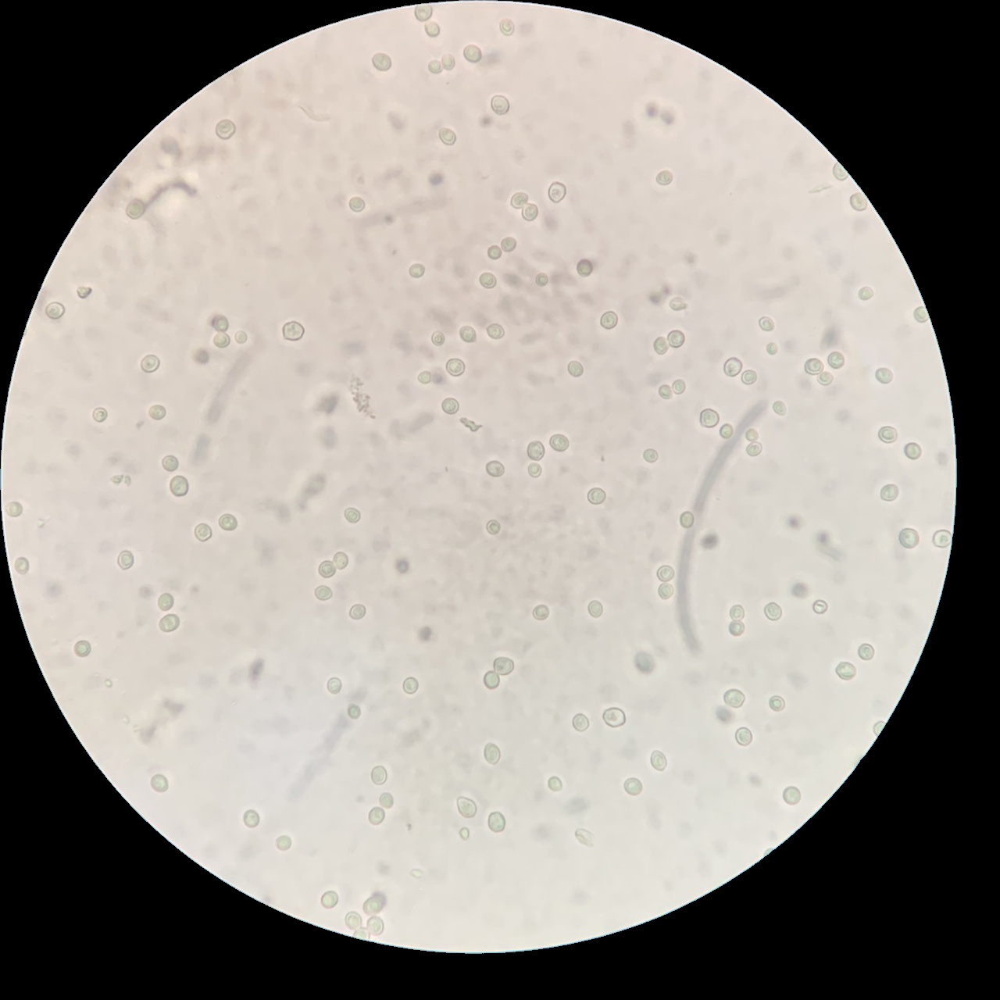

In [ ]:
cv2_imshow(anh_goc)

In [ ]:
def new_resize_image(image, target_size, value = 0):
    """
    Resize the input image to target x target x3. If the image is smaller, pad it. If it is larger, crop it.

    Parameters:
    image (array): The input image in BGR format.

    Returns:
    array: The resized image of size target x target x3.
    """
    height, width, _ = image.shape

    if height < target_size or width < target_size:
        # Calculate padding
        pad_height = max(0, target_size - height)
        pad_width = max(0, target_size - width)
        # Pad the image
        padded_image = cv2.copyMakeBorder(image, 0, pad_height, 0, pad_width, cv2.BORDER_CONSTANT, value=value)
        # Crop to ensure the final size is exactly 64x64
        resized_image = padded_image[:target_size, :target_size, :]
    else:
        # Crop the image
        start_x = (width - target_size) // 2
        start_y = (height - target_size) // 2
        resized_image = image[start_y:start_y + target_size, start_x:start_x + target_size, :]

    return resized_image

In [ ]:
anh_goc.shape

(1280, 1280, 3)

In [ ]:
def cut_unecessary_img(image):
    """
    Cắt bỏ các phần không cần thiết của ảnh và chỉ giữ lại phần chứa đối tượng chính.

    Parameters:
    image (array): Ảnh đầu vào cần xử lý, định dạng BGR.

    Returns:
    array: Ảnh đã cắt.
    """
    # Kiểm tra xem ảnh có được đọc thành công không
    if image is None:
        print("Ảnh không hợp lệ.")
        return

    # Chuyển đổi ảnh sang ảnh xám
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Thiết lập giá trị ngưỡng và ngưỡng hóa ảnh
    threshold_value = 185
    ret, thresholded_image = cv2.threshold(gray_image, threshold_value, 255, cv2.THRESH_BINARY)

    # Đảo ngược ảnh ngưỡng hóa
    thresholded_image = cv2.bitwise_not(thresholded_image)

    # Tìm tất cả các đường viền trong ảnh ngưỡng hóa
    contours, _ = cv2.findContours(thresholded_image, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

    # Tạo mask đen với kích thước tương tự ảnh xám
    mask = np.zeros_like(gray_image)

    # Lưu các đường viền thỏa mãn điều kiện vào tuple
    new_contours = ()

    # Thiết lập chiều cao tối thiểu cho đường viền (50% chiều cao ảnh)
    MIN_HEIGHT = image.shape[1] * 0.5

    # Lọc các đường viền có chiều cao lớn hơn hoặc bằng MIN_HEIGHT
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        if h >= MIN_HEIGHT:
            new_contours += (cnt,)

    if not new_contours:
        print("Không tìm thấy đường viền nào phù hợp.")
        return

    # Lấy đường viền lớn nhất thỏa mãn điều kiện
    con = new_contours[0]

    # Vẽ đường viền lên mask và tạo ra ảnh kết quả
    cv2.drawContours(mask, [con], -1, (255), thickness=cv2.FILLED)
    x, y, w, h = cv2.boundingRect(con)

    # Áp dụng mask lên ảnh gốc để giữ lại phần ảnh có chứa đối tượng chính
    result = cv2.bitwise_and(image, image, mask=mask)

    # Cắt ảnh để có kích thước 1536x1536 pixel từ phần ảnh chứa đối tượng
    result = result[y:y+1280, x:x+1280]

    result = result.astype(np.uint8)
    return result


In [ ]:
anh_goc = cut_unecessary_img(anh_goc)

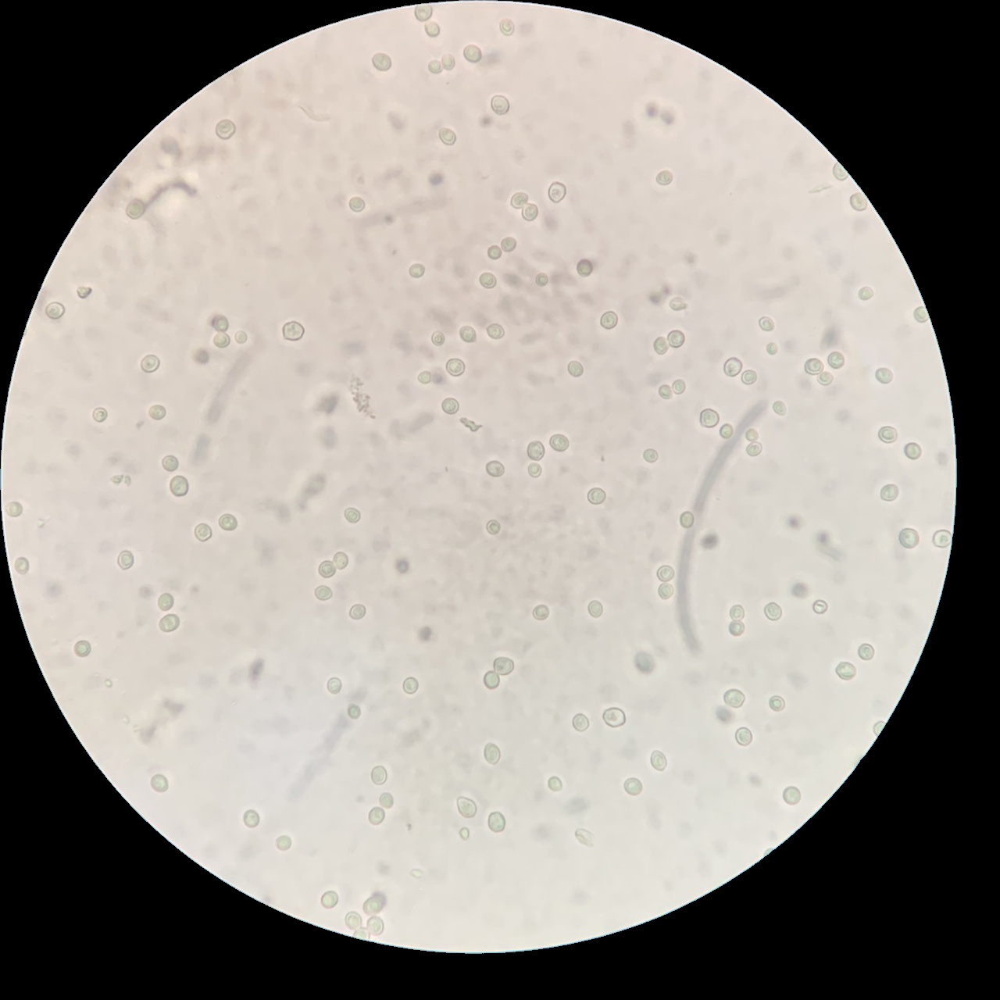

In [ ]:
cv2_imshow(anh_goc)

In [ ]:
anh_goc = new_resize_image(anh_goc, 1280, value = anh_goc[0,0].tolist())

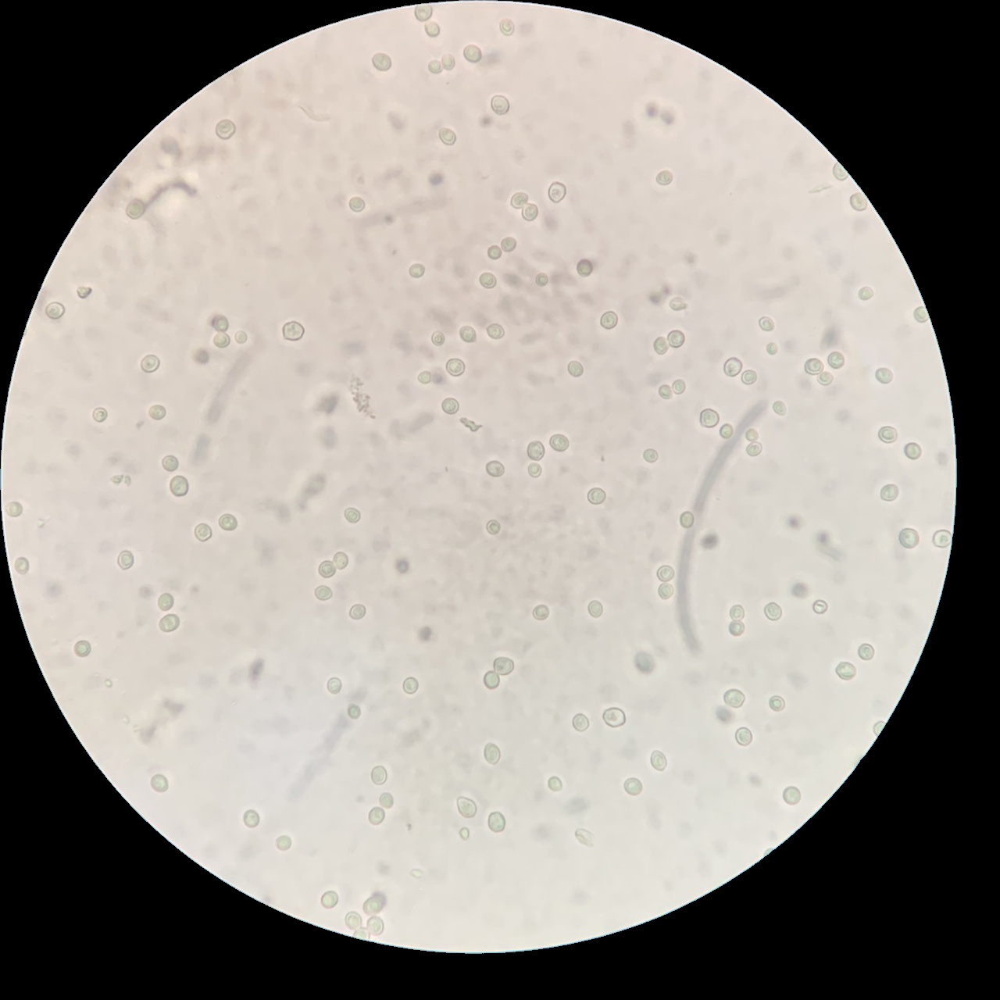

In [ ]:
cv2_imshow(anh_goc)

In [ ]:
import cv2
import numpy as np

# Process the original image
def cut_unecessary_img(image):
    """
    Crop unnecessary parts of the image and keep only the main object.

    Parameters:
    image (array): The input image to process, in BGR format.

    Returns:
    array: The cropped image or the original image if no suitable contour is found.
    """
    # Check if the image is valid
    if image is None:
        print("Invalid image.")
        return image

    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Set the threshold value and threshold the image
    threshold_value = 185
    ret, thresholded_image = cv2.threshold(gray_image, threshold_value, 255, cv2.THRESH_BINARY)

    # Invert the thresholded image
    thresholded_image = cv2.bitwise_not(thresholded_image)

    # Find all contours in the thresholded image
    contours, _ = cv2.findContours(thresholded_image, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

    # Create a black mask with the same size as the grayscale image
    mask = np.zeros_like(gray_image)

    # Save contours that meet the condition into a list
    new_contours = []

    # Set the minimum height for contours (50% of the image height)
    MIN_HEIGHT = image.shape[1] * 0.5

    # Filter contours with height greater than or equal to MIN_HEIGHT
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        if h >= MIN_HEIGHT:
            new_contours.append(cnt)

    # If no suitable contour is found, return the original image
    if not new_contours:
        return image

    # Get the largest contour that meets the condition
    con = new_contours[0]
    x, y, w, h = cv2.boundingRect(con)
    if h < image.shape[0] and w < image.shape[1]:
        # Draw a white contour on the mask
        cv2.drawContours(mask, [con], -1, (255), thickness=cv2.FILLED)

        # Apply the mask to the original image to keep the white contour area
        result = cv2.bitwise_and(image, image, mask=mask)

        # Crop the image
        result = result[y:y+h, x:x+w]

    result = result.astype(np.uint8)
    return result

# Process the cells
# Padding with the same color as the first pixel of the image
def resize_image(image, value=0):
    """
    Resize the input image to target x target x3. If the image is smaller, pad it. If it is larger, crop it.

    Parameters:
    image (array): The input image in BGR format.

    Returns:
    array: The resized image of size target x target x3.
    """
    height, width, _ = image.shape
    target_height = ((height + 127) // 128) * 128
    target_width = ((width + 127) // 128) * 128
    pad_height = max(0, target_height - height)
    pad_width = max(0, target_width - width)
    # Pad the image
    padded_image = cv2.copyMakeBorder(image, 0, pad_height, 0, pad_width, cv2.BORDER_CONSTANT, value=value)

    resized_image = padded_image[:target_height, :target_width, :]

    return resized_image

def new_resize_image(image, target_size, value=0):
    """
    Resize the input image to target x target x3. If the image is smaller, pad it. If it is larger, crop it.

    Parameters:
    image (array): The input image in BGR format.

    Returns:
    array: The resized image of size target x target x3.
    """
    height, width, _ = image.shape

    if height < target_size or width < target_size:
        # Calculate padding
        pad_height = max(0, target_size - height)
        pad_width = max(0, target_size - width)
        # Pad the image
        padded_image = cv2.copyMakeBorder(image, 0, pad_height, 0, pad_width, cv2.BORDER_CONSTANT, value=value)
        # Crop to ensure the final size is exactly target_size x target_size
        resized_image = padded_image[:target_size, :target_size, :]
    else:
        # Crop the image
        start_x = (width - target_size) // 2
        start_y = (height - target_size) // 2
        resized_image = image[start_y:start_y + target_size, start_x:start_x + target_size, :]

    return resized_image

def split_image(image, patch_size=128):
    patches = []
    h, w, _ = image.shape
    for y in range(0, h, patch_size):
        for x in range(0, w, patch_size):
            patch = image[y:y+patch_size, x:x+patch_size]
            if patch.shape[0] == patch_size and patch.shape[1] == patch_size:
                patches.append(patch)
    return patches

# Merge small images back into a large image
def merge_images(original_image, images, tile_size=128):
    height_orig, width_orig, _ = original_image.shape
    grid_height = (height_orig + tile_size - 1) // tile_size
    grid_width = (width_orig + tile_size - 1) // tile_size

    original_height = tile_size * grid_height
    original_width = tile_size * grid_width

    merged_image = np.zeros((original_height, original_width), dtype=np.float32)

    idx = 0
    for i in range(grid_height):
        for j in range(grid_width):
            if idx < len(images):
                tile = images[idx]
                if tile.ndim == 3:
                    tile = tile[:, :, 0]
                elif tile.ndim == 2:
                    tile = tile[:, :]
                merged_image[i*tile_size:(i+1)*tile_size, j*tile_size:(j+1)*tile_size] = tile
                idx += 1

    return merged_image


In [ ]:
import cv2
import numpy as np
from PIL import Image
import io

In [ ]:
def predict_mask(image_data):
    try:
        # Decode and preprocess image
        image = Image.open(io.BytesIO(image_data))
        image = np.array(image)

        # Perform image processing
        image = cut_unecessary_img(image)
        image = resize_image(image, image[0][0].tolist())
        image_normalize = image.astype(np.float32) / 255.0

        # Split image into patches
        image_array = split_image(image_normalize)

        # Predict using U-Net model
        predictions = []
        batch_size = 1

        for i in range(0, len(image_array), batch_size):
            batch = np.array(image_array[i:i+batch_size])
            batch_predictions = unet.predict(batch)
            predictions.extend(batch_predictions)

        predictions = np.array(predictions)
        merge_mask = merge_images(image,predictions)
        merge_mask = (merge_mask > 0.5).astype(np.uint8) * 255

        return image, merge_mask
    except Exception as e:
        raise RuntimeError(f"Error in image prediction: {e}")

In [ ]:
unet = load_model(model_file)

In [ ]:
file_path = "BackTest/image/2h"
img_path = glob(os.path.join(file_path, "*"))

In [ ]:
img_path

['BackTest/image/2h/F1-B1-2h-09.jpeg',
 'BackTest/image/2h/F1-B1-2h-12.jpeg',
 'BackTest/image/2h/F1-B1-2h-07.jpeg',
 'BackTest/image/2h/F1-B1-2h-03.jpeg',
 'BackTest/image/2h/F1-B1-2h-06.jpeg',
 'BackTest/image/2h/F1-B1-2h-05.jpeg',
 'BackTest/image/2h/F1-B1-2h-04.jpeg',
 'BackTest/image/2h/F1-B1-2h-08.jpeg',
 'BackTest/image/2h/F1-B1-2h-01.jpeg',
 'BackTest/image/2h/F1-B1-2h-10.jpeg',
 'BackTest/image/2h/F1-B1-2h-11.jpeg',
 'BackTest/image/2h/F1-B1-2h-02.jpeg',
 'BackTest/image/2h/Bản sao của 2024.08.29-Ethanol red- 96h - CNTP-Nhuộm- Bình 13.jpg']

In [ ]:
images = []
for i in range(len(img_path)):
    image = cv2.imread(img_path[i])
    image = cut_unecessary_img(image)
    image = image.astype(np.float32) / 255.0
    image = resize_image(image)
    patches = split_image(image)
    images.extend(patches)

In [ ]:
images = np.array(images)
images.shape

(1300, 128, 128, 3)

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

output_dir = "BackTest/Untitled folder"
os.makedirs(output_dir, exist_ok=True)

batch_size = 100
predictions = []

# Dự đoán với mô hình
for i in range(0, len(images), batch_size):
    batch_predictions = unet.predict(images[i:i+batch_size])
    predictions.extend(batch_predictions)

4/4 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

# Đảm bảo rằng thư mục đầu ra tồn tại
output_dir = "BackTest/Untitled folder"
os.makedirs(output_dir, exist_ok=True)

# Chuyển đổi dự đoán thành mảng NumPy nếu chưa phải là mảng NumPy
predictions = np.array(predictions)

# Hiển thị và lưu các ảnh và mask dự đoán tương ứng
# for i in range(len(predictions)):
#     plt.figure(figsize=(10, 5))

#     # Ảnh gốc
#     plt.subplot(1, 2, 1)
#     plt.imshow(images[i])
#     plt.title("Original Image")

#     # Mask dự đoán
#     plt.subplot(1, 2, 2)
#     plt.imshow(predictions[i].squeeze(), cmap='gray')  # Squeeze để loại bỏ kênh màu thứ ba nếu có
#     plt.title("Predicted Mask")

#     # # Lưu mask dự đoán
#     # output_file = os.path.join(output_dir, os.path.splitext(os.path.basename(images_path_list[i]))[0] + "_pred.png")

#     # Chuyển đổi dự đoán thành uint8 trước khi lưu
#     pred_mask = (predictions[i].squeeze() * 255).astype(np.uint8)  # Chuyển đổi từ [0, 1] thành [0, 255]
#     # plt.imsave(output_file, pred_mask, cmap='gray')

#     plt.show()


In [ ]:
predictions = np.array(predictions)
predictions.shape

(1300, 128, 128, 1)

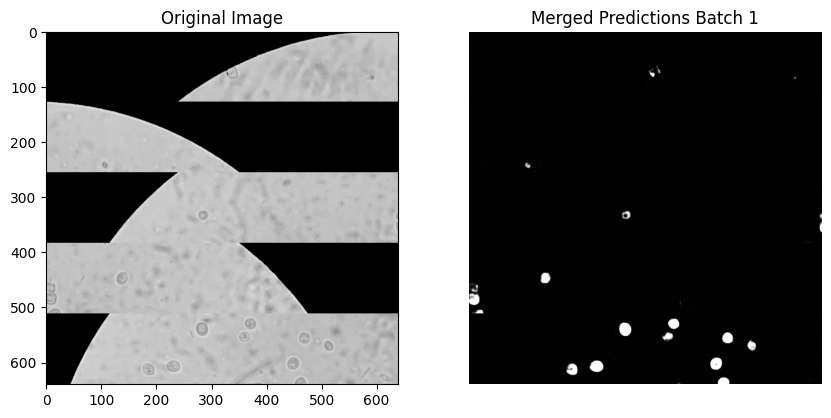

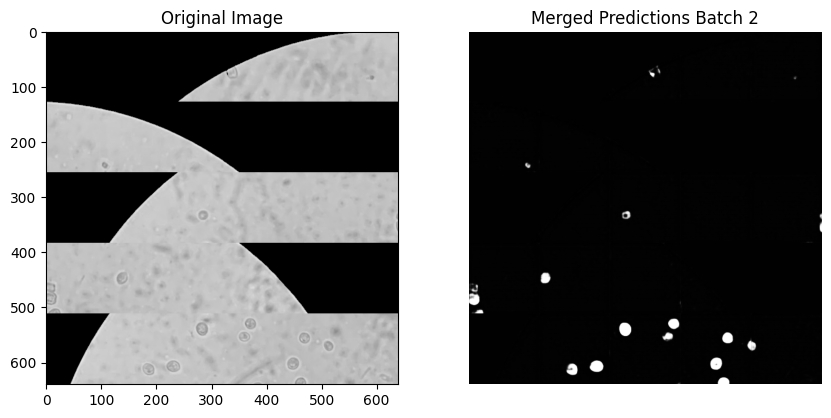

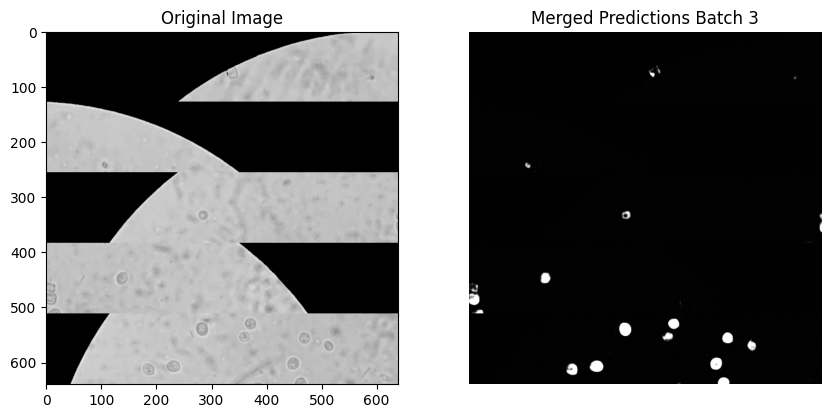

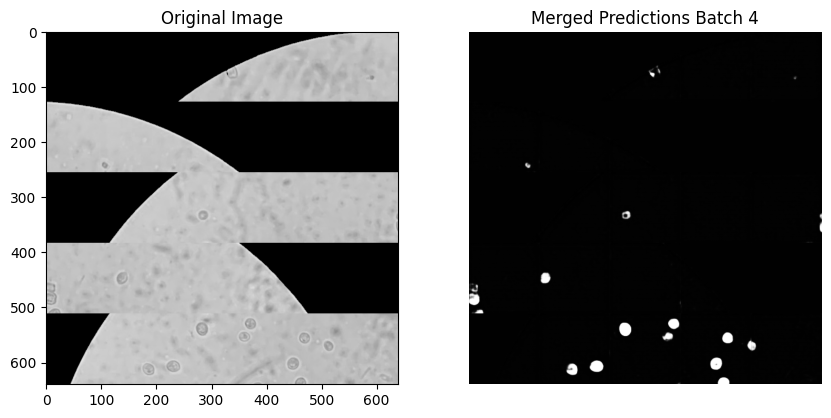

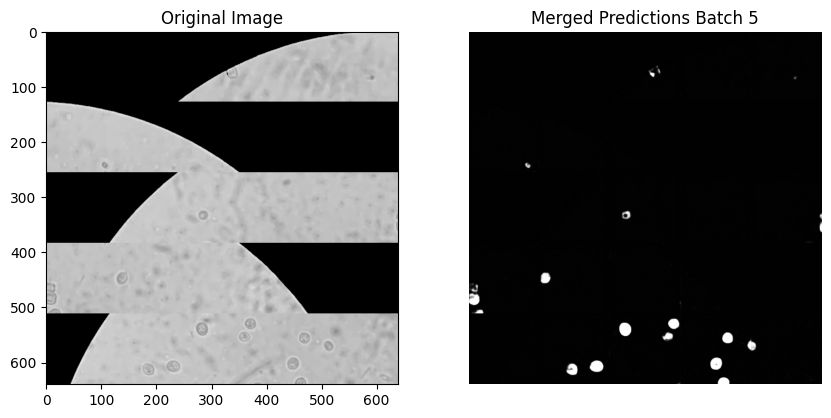

...

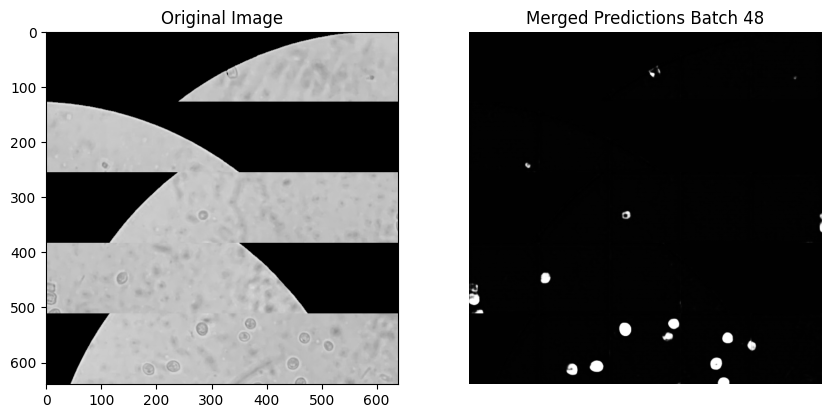

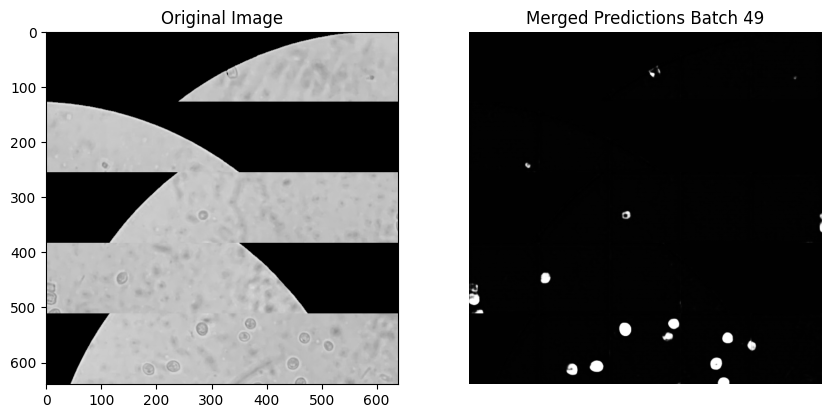

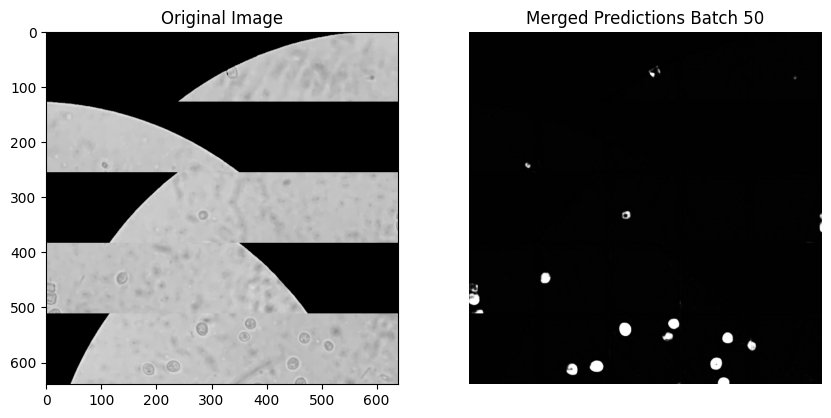

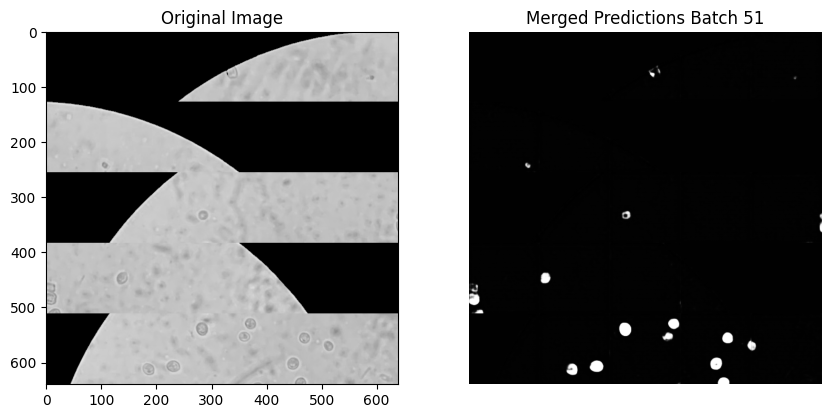

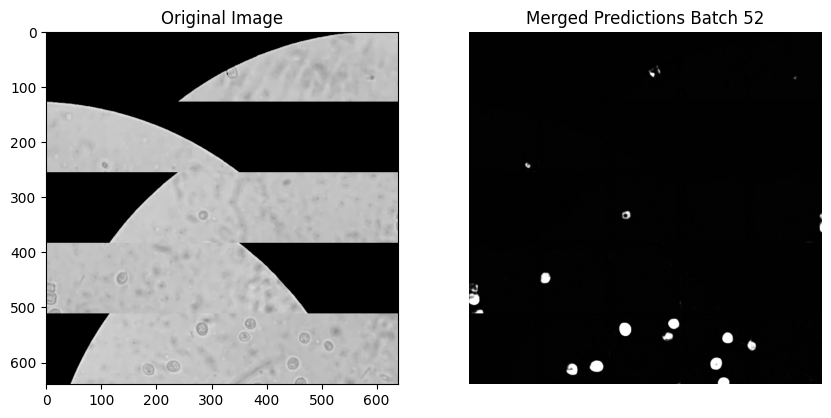

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
# Ví dụ sử dụng hàm
tile_size = 128  # Kích thước mỗi phần nhỏ
grid_size = 5  # Kích thước lưới (5x5)
batch_size = 25  # Số lượng tiles trong một ảnh lớn

merged_images = []
merged_masks = []
for start_idx in range(0, len(predictions), batch_size):
    batch_predictions = predictions[start_idx:start_idx + batch_size]

    # Merge các predictions trong batch
    merged_image = merge_images(images, tile_size, grid_size)
    merged_image = cv2.cvtColor(merged_image, cv2.COLOR_RGB2BGR)
    merged_images.append(merged_image)
    merged_mask = merge_images(predictions, tile_size, grid_size)
    merged_masks.append(merged_mask)
    # Hiển thị ảnh lớn đã ghép
    plt.figure(figsize=(10, 5))
    plt.subplot(1,2,1)
    plt.imshow(merged_image)
    plt.title("Original Image")
    plt.subplot(1,2,2)
    plt.imshow(merged_mask, cmap='gray')
    plt.title(f"Merged Predictions Batch {start_idx // batch_size + 1}")
    plt.axis('off')  # Tắt trục
    plt.show()